# Preference learning for wine quality dataset

## Data analysis

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('WineQT.csv', index_col=-1)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [192]:
from ydata_profiling import ProfileReport

ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Dataset description

This datasets contains information about Portuguese "Vinho Verde" red wine. The dataset describes the amount of various chemicals present in wine and their effect on it's quality. [Kaggle](https://www.kaggle.com/datasets/yasserh/wine-quality-dataset)

Each sample is characterized by 11 input variables and one output variable (quality). The input variables are based on physicochemical tests and the output variable is based on sensory data.:

1. **Fixed acidity** - refers to the concentration of non-volatile acids in wine, primarily tartaric acid. It gives the wine a tart or sour taste and is an important factor in determining the overall balance of the wine
2. **Volatile acidity** - concentration of volatile acids in wine, primarily acetic acid. It can give wine a vinegar-like taste and aroma and is generally considered a fault in wine
3. **Citric acid** - weak organic acid found in small amounts in some wines. It can contribute to the overall acidity and freshness of the wine
4. **Residual sugar** -  amount of sugar left in the wine after fermentation. It can contribute to the sweetness and body of the wine
5. **Chlorides** - concentration of salt in the wine. High levels of chloride can contribute to a salty taste and are generally considered a fault in wine
6. **Free sulfur dioxide** -  preservative that is added to wine to prevent spoilage from bacteria and oxidation. It can also contribute to the wine's aroma
7. **Total sulfur dioxide** - sum of free and bound sulfur dioxide in the wine. Bound sulfur dioxide is the portion that has combined with other components in the wine and is not immediately available as a preservative.
8. **Density** -  mass of the wine per unit of volume. It can be used to estimate the alcohol content of the wine
9. **pH** - measure of the acidity or basicity of the wine. Lower pH values indicate higher acidity
10. **Sulphates** -  type of salt that is added to wine as a preservative. They can also contribute to the wine's aroma and taste
11. **Alcohol** - amount of ethanol in the wine. It can contribute to the wine's body, sweetness, and overall balance

The output variable is the quality of the wine, on a scale from 0 to 10. However here we will only consider two classes: good (quality > 5) and bad (quality <= 5).

### Data analysis

- The dataset doesn't contain any missing values, but it hase 114 (~10%) of duplicates. We decided to keep them, as they might give some additional information about the data (e.g. in case of distribution)

- Quality, pH, density seem to follow normal distribution

- Fixed acidity, residual sugars, chlorides, sulpahates has distribution that in most cases look like the normal distribution with very long tails. The long tails look like they were outliers, but we don't want to remove them, as they might be important for the model as we're not sure of their origin.

- Other column's distributions don't look strange, but they are not normal. Also, we don't see any significant outliers in them.

- The data seems to be balanced enough. The only column that takes correlation values around (-)0.7 is the fixed acidity (with citric acid, density and pH). **Warning** - those correlation values might have impact on partial dependence plot, as PDP assumes that the features are independent.


In [3]:
df['score'] = df['quality'].apply(lambda x: 'good' if x > 5 else 'bad')
df.drop('quality', axis=1, inplace=True)

In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,score
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,bad
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,bad
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,good
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad


In [5]:
df.to_csv('WineQT_cleaned.csv')

## First model - XGBoost

### Data preparation

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

df = pd.read_csv('WineQT_cleaned.csv', index_col=0)
X = df.drop('score', axis=1)
y = df['score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [87]:
features = X.columns

### Features monotonicity

In [88]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)

lr.coef_

array([ 4.50221283e-02, -7.02136880e-01, -3.41320472e-01, -9.15654141e-03,
       -6.27979367e-01,  2.62556846e-03, -2.28384259e-03, -9.48746143e+00,
        1.13274070e-01,  5.31827823e-01,  1.53566726e-01])

In [89]:
monotone_constraints = ['1' if coef > 0 else '-1' for coef in lr.coef_]

### Model training

In [90]:
params = {
    "max_depth": 3,
    "eta": 0.1,
    "nthread": 2,
    "seed": 0,
    "eval_metric": "rmse",
    "monotone_constraints": "(" + ",".join(monotone_constraints) + ")",
    "n_estimators": 1,
}

In [91]:
model = XGBClassifier(**params)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('Accuracy Score: ', round(accuracy_score(y_test, y_pred), 4))
print('Confusion Matrix: \n', confusion_matrix(y_test, y_pred))
print('Classification Report: \n', classification_report(y_test, y_pred))



Accuracy Score:  0.738
Confusion Matrix: 
 [[ 62  40]
 [ 20 107]]
Classification Report: 
               precision    recall  f1-score   support

           0       0.76      0.61      0.67       102
           1       0.73      0.84      0.78       127

    accuracy                           0.74       229
   macro avg       0.74      0.73      0.73       229
weighted avg       0.74      0.74      0.73       229



### Model explaination

In [92]:
booster = model.get_booster()
booster.feature_names = list(features)

In [93]:
from xgboost import plot_tree

<AxesSubplot: >

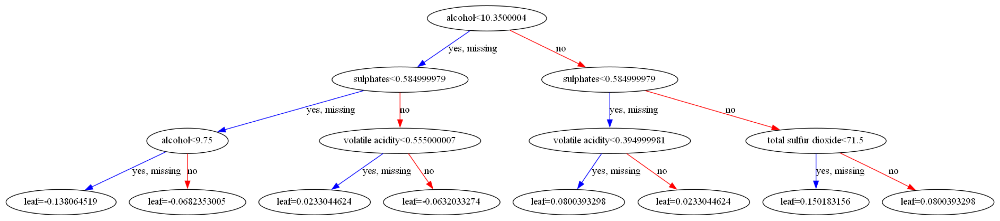

In [94]:
fig, ax = plt.subplots(figsize=(40, 20))
plot_tree(model, ax=ax, num_trees=0)

Features importance: ([source](https://github.com/dmlc/xgboost/blob/master/python-package/xgboost/core.py#L2583))

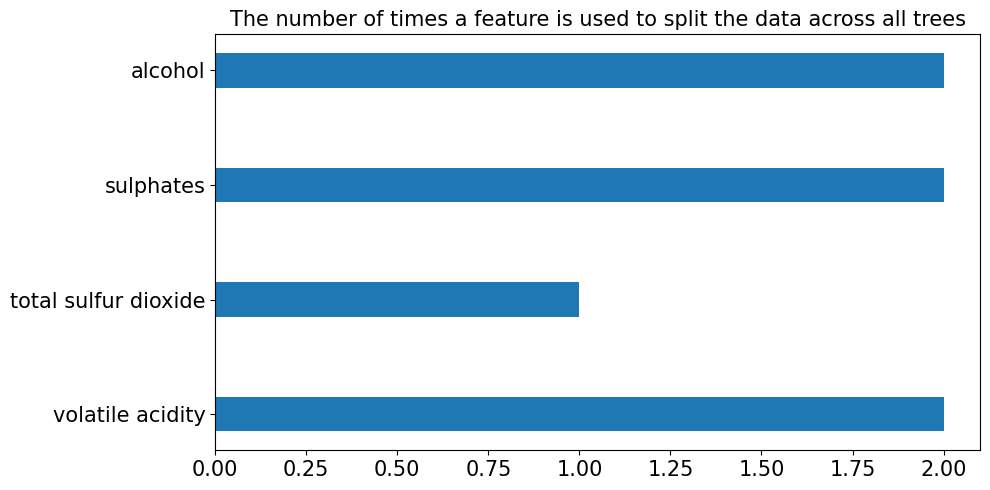

In [95]:
fscores = booster.get_fscore()
plt.figure(figsize=(10, 5))
plt.barh(list(fscores.keys()), list(fscores.values()), height=0.3)
plt.title("The number of times a feature is used to split the data across all trees",
          fontsize=15)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.tight_layout()
plt.show()

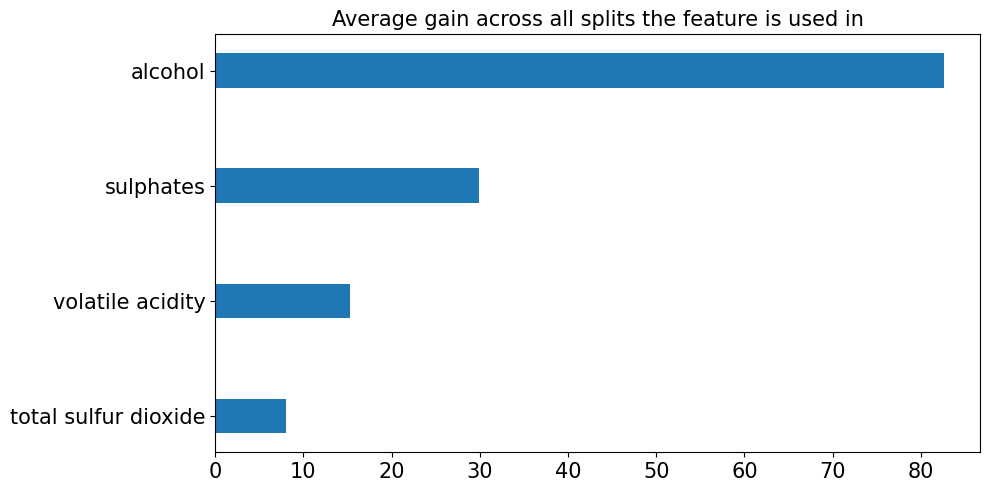

In [16]:
score = booster.get_score(importance_type='gain')
score = {k: v for k, v in sorted(score.items(), key=lambda item: item[1])}
plt.figure(figsize=(10, 5))
plt.barh(list(score.keys()), list(score.values()), height=0.3)
plt.title("The number of times a feature is used to split the data across all trees")
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.tight_layout()
plt.title("Average gain across all splits the feature is used in", fontsize=15)
plt.show()

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


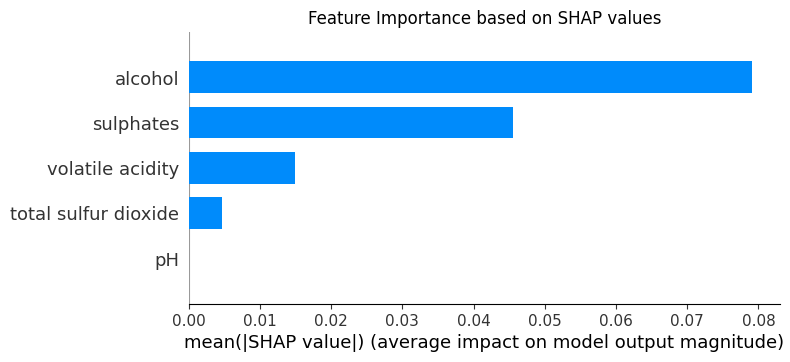

In [17]:
import shap

shap.initjs()
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar",
                  feature_names=features, show=False, max_display=5)
plt.title("Feature Importance based on SHAP values")
plt.show()

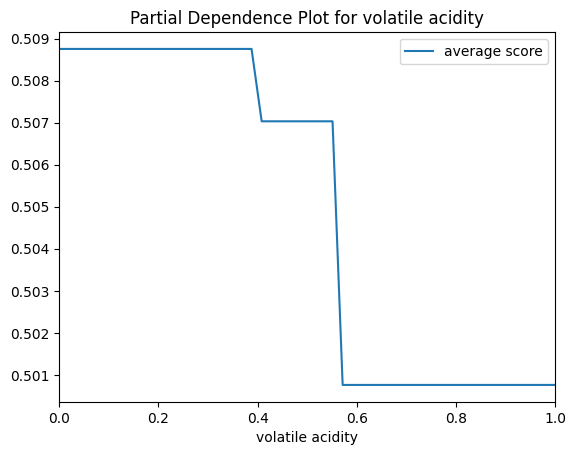

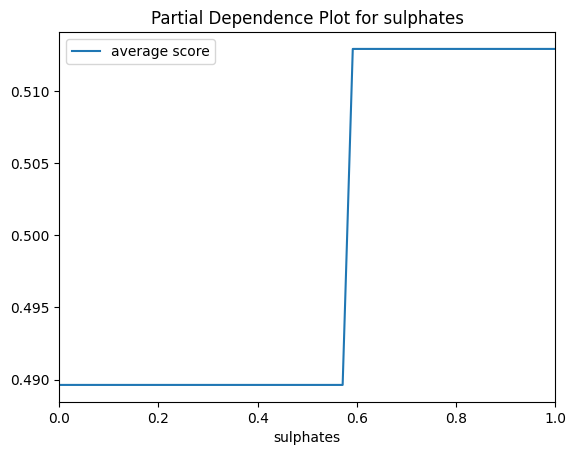

In [18]:
grid = np.linspace(0,1,50)
for c in range(len(features)):
    y_pred = np.zeros(len(grid))
    for i, val in enumerate(grid):
        X_temp = X_train.values.copy()
        X_temp[:, c] = val
        data = xgb.DMatrix( pd.DataFrame(X_temp), feature_names=features)
        y_pred[i] = np.average(booster.predict(data))
        
    if len(set(y_pred)) == 1: # if all the predictions are the same, skip the plot
        continue
    fig, ax = plt.subplots()
    ax.plot(grid, y_pred,  label='average score')
    ax.set_xlim(0, 1)
    ax.set_xlabel(features[c])
    ax.title.set_text('Partial Dependence Plot for ' + features[c])
    ax.legend()

### Analytical 3 samples explanation

In [96]:
samples = X_test.sample(3, random_state=42)
samples

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
Id,,,,,,,,,,,
395,12.0,0.37,0.76,4.2,0.066,7.0,38.0,1.0004,3.22,0.60,13.0
533,10.3,0.27,0.24,2.1,0.072,15.0,33.0,0.9956,3.22,0.66,12.8
592,9.0,0.45,0.49,2.6,0.084,21.0,75.0,0.9987,3.35,0.57,9.7


In [97]:
pred = model.predict(samples)
pred = le.inverse_transform(pred)
pred

array(['good', 'good', 'bad'], dtype=object)

In [20]:
shap_values = explainer.shap_values(samples)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


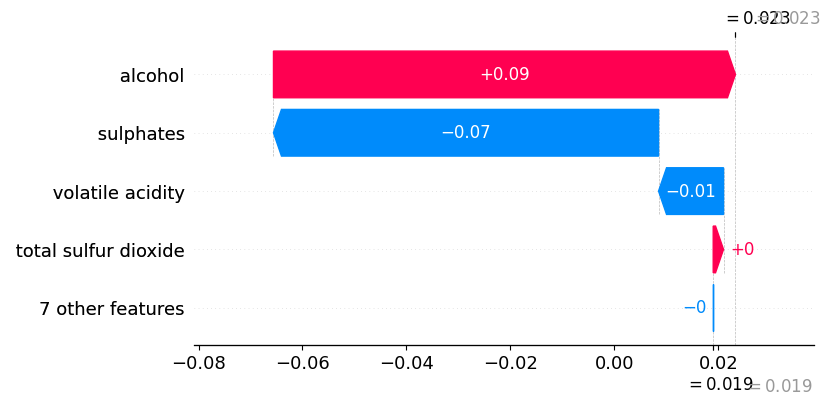

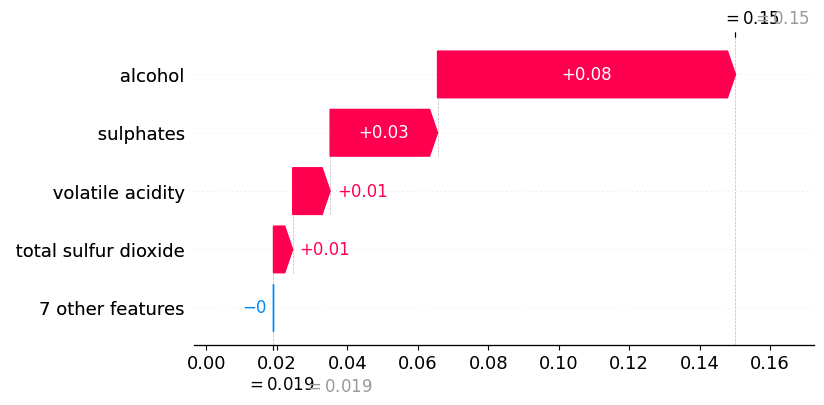

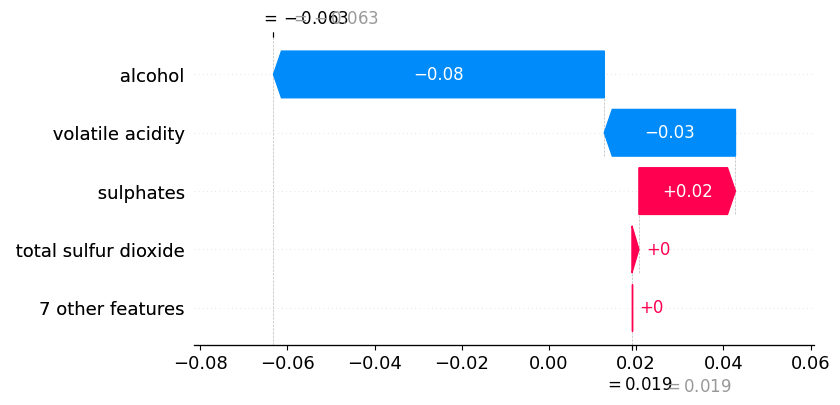

In [26]:
for i in range(len(samples)):
    shap.plots._waterfall.waterfall_legacy(explainer.expected_value, shap_values[i,:], samples.iloc[i,:], feature_names=features, max_display=5)

TODO


- Try answer this question in an analytical way based only on the values
of the model parameters and explain why such a change is minimal
(without sampling).


- Perform space sampling by slightly changing the evaluations of alternatives to get a different class. Do the results agree with theoretical
predictions?

## ANN Choquet integral

### Model definition

In [213]:
import torch.nn as nn
import torch.nn.functional as F
from helpers import *

class LinearGreaterThanZero(nn.Linear):
    def __init__(self, in_features, bias=False, min_w=0.0000001):
        super().__init__(in_features, 1, bias)
        self.is_bias = bias
        self.min_w = min_w
        if bias:
            nn.init.uniform_(self.bias, self.min_w, 1.0)
        else:
            self.bias = None

    def reset_parameters(self):
        nn.init.uniform_(self.weight, 0.1, 1.0)

    def w(self):
        with torch.no_grad():
            self.weight.data[self.weight.data < 0] = self.min_w
        return self.weight

    def forward(self, input):
        return F.linear(input, self.w(), self.bias)
    
class LinearInteraction(nn.Linear):
    def __init__(self, in_features, criterion_layer):
        super().__init__(((in_features - 1) * in_features) // 2, 1, False)
        self.in_features = in_features
        self.criterion_layer = criterion_layer

    def reset_parameters(self):
        nn.init.normal_(self.weight, 0.0, 0.1)

    def w(self):
        with torch.no_grad():
            w_i = 0
            w = self.criterion_layer.w()
            for i in range(self.in_features):
                for j in range(i + 1, self.in_features):
                    self.weight.data[:, w_i] = torch.max(
                        self.weight.data[:, w_i], -w[:, i]
                    )
                    self.weight.data[:, w_i] = torch.max(
                        self.weight.data[:, w_i], -w[:, j]
                    )
                    w_i += 1
        return self.weight

    def forward(self, input):
        return F.linear(input, self.w(), None)

class ThresholdLayer(nn.Module):
    def __init__(self, threshold=None, requires_grad=True):
        super().__init__()
        if threshold is None:
            self.threshold = nn.Parameter(
                torch.FloatTensor(1).uniform_(0.1, 0.5), requires_grad=requires_grad
            )
        else:
            self.threshold = nn.Parameter(
                torch.FloatTensor([threshold]), requires_grad=requires_grad
            )

    def forward(self, x):
        return x - self.threshold
    
class ChoquetConstrained(nn.Module):
    def __init__(self, criteria_nr, **kwargs):
        super().__init__()
        self.criteria_nr = criteria_nr
        self.criteria_layer = LinearGreaterThanZero(criteria_nr)
        self.interaction_layer = LinearInteraction(criteria_nr, self.criteria_layer)
        self.thresholdLayer = ThresholdLayer()

    def forward(self, x):
        if len(x.shape) == 3:
            x = x[:, 0, :]
        x_wi = self.criteria_layer(x[:, : self.criteria_nr])
        x_wij = self.interaction_layer(x[:, self.criteria_nr :])
        weight_sum = self.criteria_layer.w().sum() + self.interaction_layer.w().sum()
        score = (x_wi + x_wij) / (weight_sum)
        return self.thresholdLayer(score)
    
def mobious_transform(row):
    return list(row) + [
        min(row[i], row[j]) for i in range(len(row)) for j in range(i + 1, len(row))
    ]




### Data preparation

In [214]:
df = pd.read_csv('WineQT_cleaned.csv', index_col=0)

X = df.drop('score', axis=1)
y = df['score']

data_input = X.apply(
    lambda x: mobious_transform(x), axis=1, result_type="expand"
)


X_train, X_test, y_train, y_test = train_test_split(
    data_input.values, y.values, test_size=0.2, random_state=1234
)

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [215]:
train_dataloader = CreateDataLoader(X_train, y_train)
test_dataloader = CreateDataLoader(X_test, y_test)

In [216]:
PATH = "choquet.pt"

### Model training

In [217]:
model = ChoquetConstrained(len(features))


In [218]:
acc, acc_test, auc, auc_test = Train(model, train_dataloader, test_dataloader, PATH)

print("Accuracy train:\t%.2f%%" % (acc * 100.0))
print("AUC train: \t%.2f%%" % (acc_test * 100.0))
print()
print("Accuracy test:\t%.2f%%" % (auc * 100.0))
print("AUC test: \t%.2f%%" % (auc_test * 100.0))


100%|██████████| 200/200 [00:07<00:00, 26.12it/s]

Accuracy train:	57.00%
AUC train: 	56.86%

Accuracy test:	58.76%
AUC test: 	58.03%


### Model explaination

TODO

- Try answer this question in an analytical way based only on the values
of the model parameters and explain why such a change is minimal
(without sampling).

- Perform space sampling by slightly changing the evaluations of alternatives to get a different class. Do the results agree with theoretical
predictions?

- XAI


## MLP

### Data preparation

In [100]:
df = pd.read_csv('WineQT_cleaned.csv', index_col=0)

X = df.drop('score', axis=1)
y = df['score']

X_train, X_test, y_train, y_test = train_test_split(
    X.values, y.values, test_size=0.2, random_state=1234
)

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

### Model training

In [101]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, roc_auc_score

mlp = MLPClassifier(hidden_layer_sizes=(100, 32), max_iter=1000, alpha=0.001, 
                    solver='sgd', random_state=1234)
mlp.fit(X_train, y_train)

y_pred = mlp.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print(f'AUC: {roc_auc_score(y_test, y_pred)}')


Accuracy: 0.6855895196506551
AUC: 0.6680875576036867


### Model explaination
Using SHAP [KernelExplainer](https://shap-lrjball.readthedocs.io/en/latest/example_notebooks/kernel_explainer/Census%20income%20classification%20with%20Keras.html)

In [102]:
import shap

explainer = shap.KernelExplainer(mlp.predict_proba, X_train[:50])
shap_values = explainer.shap_values(X_test, nsamples=100)


  0%|          | 0/229 [00:00<?, ?it/s]

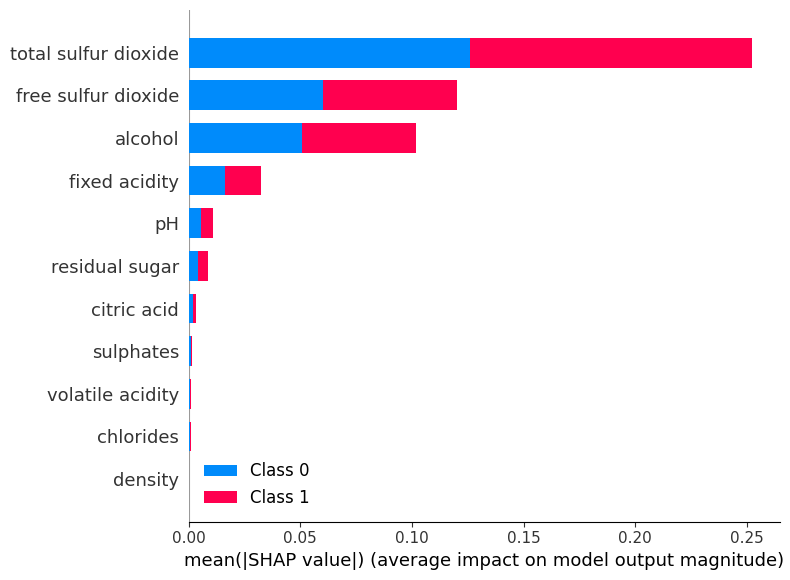

In [34]:
shap.summary_plot(shap_values, X_test, plot_type="bar", feature_names=X.columns)

### Analytical 3 samples explanation

In [105]:
np.random.seed(55)
samples = X_test[np.random.choice(X_test.shape[0], 3, replace=False)]
samples_df = pd.DataFrame(samples, columns=X.columns)
samples_df


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.7,0.64,0.21,2.2,0.077,32.0,133.0,0.9956,3.27,0.45,9.9
1,7.9,0.18,0.40,1.8,0.062,7.0,20.0,0.9941,3.28,0.70,11.1
2,7.6,0.30,0.42,2.0,0.052,6.0,24.0,0.9963,3.44,0.82,11.9


In [106]:
pred = mlp.predict(samples)
pred = le.inverse_transform(pred)
pred

array(['bad', 'good', 'good'], dtype=object)

In [107]:
shap_values = [explainer.shap_values(samples[i]) for i in range(len(samples))]

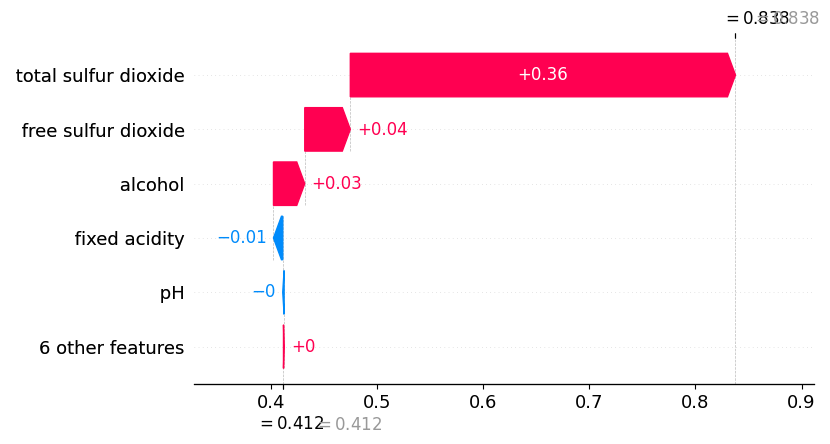

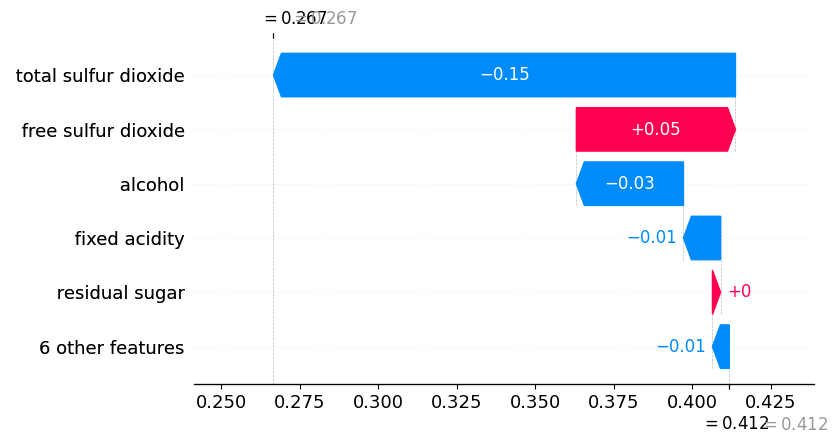

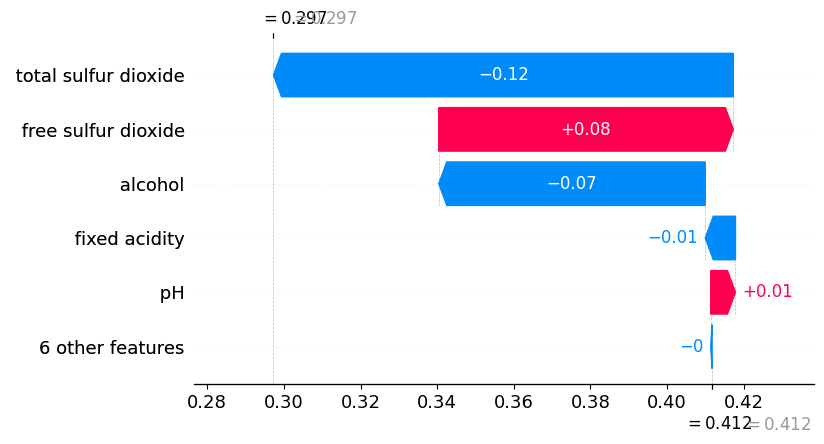

In [109]:
for i in range(len(samples)):
    shap.plots._waterfall.waterfall_legacy(explainer.expected_value[0], shap_values[i][0], samples_df.iloc[i], feature_names=features, max_display=6)

TODO

- Try answer this question in an analytical way based only on the values
of the model parameters and explain why such a change is minimal
(without sampling).

- Perform space sampling by slightly changing the evaluations of alternatives to get a different class. Do the results agree with theoretical
predictions?

- XAI
